# Project Report

### Abalone Research Question: How do different physical factors of an abalone impact the shucked weight amount? 

### dataset: https://archive.ics.uci.edu/dataset/1/abalone

### Ellie Choi, Emma Knoll, Jimin Han, Zahra Mirza

# 1. Introduction
Over the past few years, there has been an increase in demand for seafood. As a result, legal abalone fisheries are swiftly being overtaken by illegal competitors.  Several factors govern the price of abalone in the international market, including production and export volumes, among others. Therefore, it is of interest to elucidate the factors that drive abalone supply and demand (Hernandez- Casas et al., 2022) .In terms of in-shell (shucked) weight, legal abalone fisheries have gone from harvesting “from more than 27,000 metric tonnes in the late 1960s to only about 5800 tonnes in 2018” (Cook, 2023). One way fisheries can increase their production of abalones in an efficient way to drive out competitors, is to understand which abalones produce the most shucked weight and use this information to breed abalones to maximize the shucked weight produced. Using the dataset from the UC Irvine Machine Learning Repository, we will look at how we can use physical factors of abalones such as length (mm), diameter (mm), height (mm), whole weight (g), viscera weight (g), shell weight (g), and age to predict an abalone’s shucked weight, which is what can be sold on the market. To calculate the age of the abalone, as specified in the website of the dataset provided, age in years can be calculated by adding 1.5 to the number of rings.  


# 2. Methods
We aim to create a highly accurate regression model. We will build a linear regression model for each factor that is easily measurable and significantly affects the shucked weight of abalones. These factors are  shell length, diameter, heigh, whole weight, viscera weight, shell weight, rings. To do this, we first load our data into R, and then tidy and wrangle our data to change the sex columns variable from character type to factor type. We then split our data into the training and testing sets, for further classification. We also summarize the data and group it to see how many observations of each abalone sex are there. The mean amount of each predictor variable is found to make the plotting easier. All of the 7 variables will be used and we will visualize the relationships and the predictor variable’s accuracy using scatterplots. The points will be coloured according to the abalone sex. We use this classification model to predict the shucked weight of abalones, using the predictors  : shell length, diameter, heigh, whole weight, viscera weight, shell weight, rings. 

The lm() function creates a linear regression model in R. This function takes an R formula Y ~ X where Y is the outcome variable and X is the predictor variable.
To create a multiple linear regression model in R, add additional predictor variables using +.

We can perform simple linear regression in R using tidymodels. To do this,we use a linear_reg model specification with the lm engine. we do not need to choose 
K in the context of linear regression, and so we do not need to perform cross-validation. 

We start by loading packages, setting the seed, loading data, and putting some test data away in a lock box that we can come back to after we choose our final model. 
 we will create the model specification and recipe, and fit our simple linear regression model
We do not need to standardize the coefficients as if we leave the predictors in the original form, the best fit coefficients are simpler to interpret. 


In [1]:
set.seed(2000)
library(tidyverse)
install.packages("kknn")
library(kknn)
library(tidymodels)
options(repr.matrix.max.rows = 6)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks strin

In [2]:
#Loading dataset csv
url <- "https://raw.githubusercontent.com/eknoll02/dsci-100-003-group-3/main/abalone.csv"

#Creating understandable columns
c <- c("sex", "length", "diameter", "height", "whole_weight", "shucked_weight", "viscera_weight", "shell_weight", "rings")

abalone<- read_csv(url, col_names = c) 
abalone

Rows: 4177 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): sex
dbl (8): length, diameter, height, whole_weight, shucked_weight, viscera_wei...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


sex,length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,rings
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.15,15
M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.07,7
F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.21,9
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.308,9
F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.296,10
M,0.710,0.555,0.195,1.9485,0.9455,0.3765,0.495,12


In [3]:
# Wrangling our data set to only get the variables needed for our analysis
abalone <- abalone |>
mutate(age_years = rings + 1.5) |>
select(-rings) |>
select(-sex)

abalone

length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,age_years
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.455,0.365,0.095,0.5140,0.2245,0.1010,0.15,16.5
0.350,0.265,0.090,0.2255,0.0995,0.0485,0.07,8.5
0.530,0.420,0.135,0.6770,0.2565,0.1415,0.21,10.5
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.600,0.475,0.205,1.1760,0.5255,0.2875,0.308,10.5
0.625,0.485,0.150,1.0945,0.5310,0.2610,0.296,11.5
0.710,0.555,0.195,1.9485,0.9455,0.3765,0.495,13.5


In [4]:
# spliting data into 75% training, 25% testing
abalone_split <- initial_split(abalone, prop = 0.75, strata = shucked_weight)
abalone_testing <- testing(abalone_split)
abalone_training <- training(abalone_split)

abalone_testing
abalone_training

length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,age_years
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.425,0.300,0.095,0.3515,0.141,0.0775,0.12,9.5
0.530,0.415,0.150,0.7775,0.237,0.1415,0.33,21.5
0.545,0.425,0.125,0.7680,0.294,0.1495,0.26,17.5
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,11.5
0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,10.5
0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,11.5


length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,age_years
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.35,0.265,0.09,0.2255,0.0995,0.0485,0.070,8.5
0.33,0.255,0.08,0.2050,0.0895,0.0395,0.055,8.5
0.43,0.350,0.11,0.4060,0.1675,0.0810,0.135,11.5
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
0.695,0.550,0.195,1.6645,0.7270,0.3600,0.445,12.5
0.770,0.605,0.175,2.0505,0.8005,0.5260,0.355,12.5
0.710,0.555,0.195,1.9485,0.9455,0.3765,0.495,13.5


In [5]:
# overview of dataset means
abalone_mean <- abalone_training |>
map_dfr(mean)

abalone_mean

length,diameter,height,whole_weight,shucked_weight,viscera_weight,shell_weight,age_years
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.5233983,0.4075088,0.1393485,0.8264069,0.3591669,0.1797264,0.2380618,11.42431


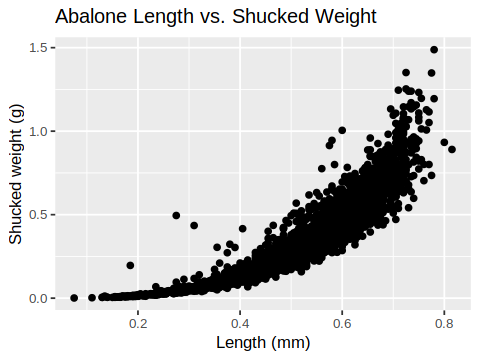

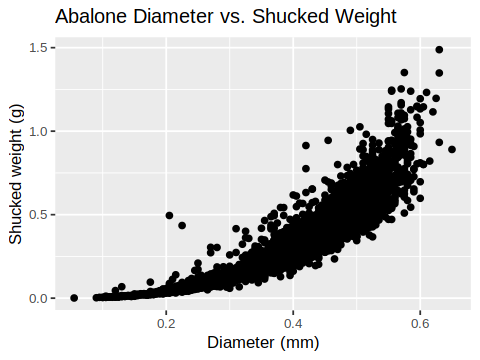

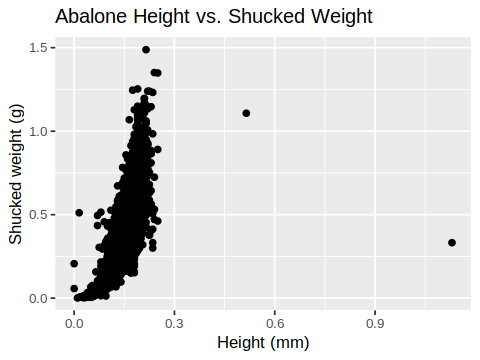

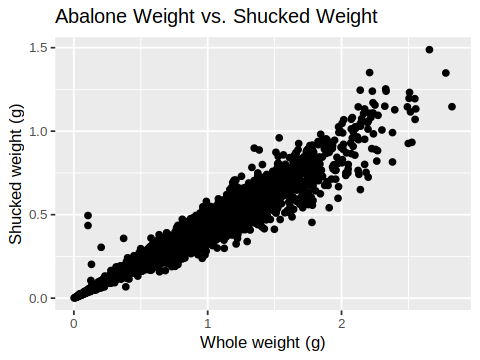

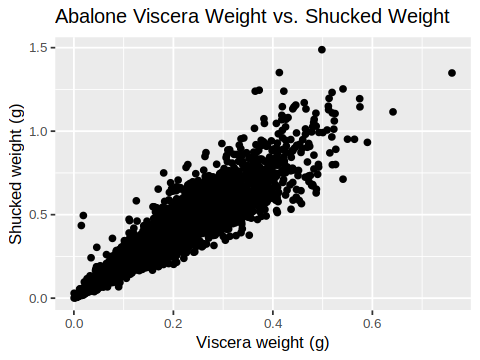

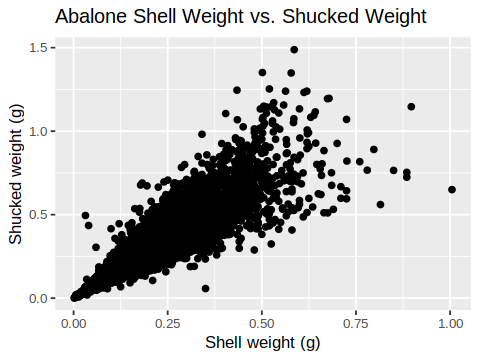

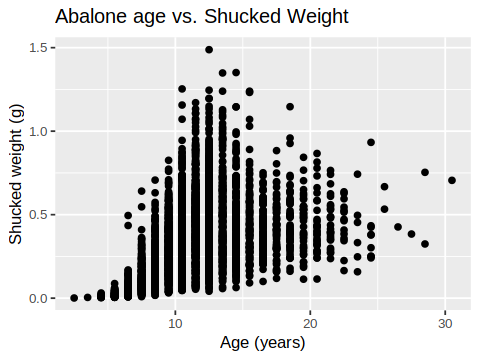

In [6]:
# Different visualizations of the relationship of an abalone's shucked weight in grams compared to each predictor

options(repr.plot.width = 4, repr.plot.height = 3)
abalone_length_plot <- abalone |>
ggplot(aes(x = length, y = shucked_weight)) +
geom_point() +
labs(x = "Length (mm)", y = "Shucked weight (g)") +
ggtitle("Abalone Length vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_diameter_plot <- abalone |>
ggplot(aes(x = diameter, y = shucked_weight)) +
geom_point() +
labs(x = "Diameter (mm)", y = "Shucked weight (g)") +
ggtitle("Abalone Diameter vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_height_plot <- abalone |>
ggplot(aes(x = height, y = shucked_weight)) +
geom_point() +
labs(x = "Height (mm)", y = "Shucked weight (g)") +
ggtitle("Abalone Height vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_weight_plot <- abalone |>
ggplot(aes(x = whole_weight, y = shucked_weight)) +
geom_point() +
labs(x = "Whole weight (g)", y = "Shucked weight (g)") +
ggtitle("Abalone Weight vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_viscera_weight_plot <- abalone |>
ggplot(aes(x = viscera_weight, y = shucked_weight)) +
geom_point() +
labs(x = "Viscera weight (g)", y = "Shucked weight (g)") +
ggtitle("Abalone Viscera Weight vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_shell_weight_plot <- abalone |>
ggplot(aes(x = shell_weight, y = shucked_weight)) +
geom_point() +
labs(x = "Shell weight (g)", y = "Shucked weight (g)") +
ggtitle("Abalone Shell Weight vs. Shucked Weight") +
theme(text = element_text(size = 10))

abalone_age_plot <- abalone |>
ggplot(aes(x = age_years, y = shucked_weight)) +
geom_point() +
labs(x = "Age (years)", y = "Shucked weight (g)") +
ggtitle("Abalone age vs. Shucked Weight") +
theme(text = element_text(size = 10)) 


abalone_length_plot
abalone_diameter_plot 
abalone_height_plot 
abalone_weight_plot
abalone_viscera_weight_plot
abalone_shell_weight_plot
abalone_age_plot

**Linear Regression** 
Though a KNN regression is helpful when looking at relationships between the predictors in the data, a linear regression can create a model to understand how to predict the shucked weight of an abalone outside of this given dataset. 

In [7]:
# Creating a recipe and standardizing our datset
abalone_recipe <- recipe(shucked_weight ~ ., data = abalone_training) |>
                    step_scale(all_predictors()) |>
                    step_center(all_predictors())

# Creating a linear regression model specification
lm_spec <- linear_reg() |>
set_engine("lm") |>
set_mode("regression")
lm_spec

# Creating a workflow analysis and fitting it to the linear regression model
abalone_fit <- workflow() |>
add_recipe(abalone_recipe) |>
add_model(lm_spec) |>
fit(data = abalone_training)

abalone_fit

Linear Regression Model Specification (regression)

Computational engine: lm 


══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: linear_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
stats::lm(formula = ..y ~ ., data = data)

Coefficients:
   (Intercept)          length        diameter          height    whole_weight  
     0.3591669       0.0215366      -0.0021757       0.0005892       0.3510380  
viscera_weight    shell_weight       age_years  
    -0.0502402      -0.0988087      -0.0200803  


**Recipe for predicting shucked weight** <br> <br>
$ Predicted \ shucked\ weight \ of \ abalone \ (in \ grams) = 0.3591669 + 0.0215366 * length \ (mm) - 0.0021757 * diameter \ (mm) + 0.005892 * height \ (mm) + 0.3510389 * whole \ weight \ (g) - 0.050402 * viscera \ weight \ (g) - 0.0988087 * shell \ weight \ (g) - 0.0200803 * age \ (years)$

In [8]:
# Calculating RMSPE according to 
abalone_rmspe <- abalone_fit |>
predict(abalone_testing) |>
bind_cols(abalone_testing) |>
metrics(truth = shucked_weight, estimate = .pred) |>
filter(.metric == "rmse") |>
select(.estimate) |>
pull()

abalone_rmspe

[1] 0.03799691

**RMSPE** 0.0379969109458351

# 3. Results

### Model Tuning and Preprocessing:
1. **Data Loading and Wrangling:** We began by loading the abalone dataset directly from the web. The columns were renamed to improve clarity and usability. Subsequently, we transformed the dataset, calculating the age of abalones by adding 1.5 to the number of rings, and removed unnecessary columns such as 'sex' and 'rings'.


2. **Data Splitting:** The dataset was divided into training and testing sets, with 75% of the data allocated for training and 25% for testing. This ensures the model is evaluated on unseen data to assess its generalization performance.


3. **Data Visualization for Exploratory Data Analysis:** Exploratory data analysis was conducted through a series of scatterplots to visualize the relationships between shucked weight and predictor variables. Each plot provides a unique perspective, aiding in understanding potential patterns and trends.


### Regression Model Building:
1. **Model Training:** A linear regression model was built for each of the selected predictor variables (shell length, diameter, height, whole weight, viscera weight, shell weight, rings). The dataset was standardized through preprocessing steps, and a linear regression model was fitted using the training data.


2. **Model Evaluation:** The trained regression model was evaluated on the testing set, and the Root Mean Squared Prediction Error (RMSPE) was calculated to gauge the accuracy of the model's predictions.

# 4. Discussion

The question that we were trying to answer by using a regression was this: “How do different physical factors of an abalone impact the shucked weight amount?” To answer this question, we build a linear regression model for each factor that is easily measurable and significantly affects the shucked weight of abalones.

### What do you expect to find?
We expect to find that certain physical factors, such as shell length, diameter, and weight, significantly impact the shucked weight of abalones. Through our analysis, we may also uncover patterns and relationships among these variables that could provide a basis for more accurate predictions. As for gender classification, we anticipate identifying distinctive features that allow for a reliable classification model.
### Summary of what we found
In this study, the analysis of abalone characteristics and their impact on shucked weight involved a systematic process. The abalone dataset, sourced from the web, underwent meticulous data loading and wrangling. To enhance clarity and usability, columns were thoughtfully renamed, and the age of abalones was calculated by adding 1.5 to the number of rings. Unnecessary columns, namely 'sex' and 'rings,' were judiciously removed. Ensuring a robust evaluation of model generalization, the dataset was effectively split into training (75%) and testing (25%) sets. Employing scatterplots, the exploratory data analysis visually unveiled relationships between shucked weight and key predictor variables, offering valuable insights into potential patterns and trends. Moving forward, linear regression models were meticulously constructed for essential predictors, including shell length, diameter, height, whole weight, viscera weight, shell weight, and rings. The dataset underwent standardization during preprocessing, and the models were proficiently fitted using the training data. The efficacy of the regression models was rigorously assessed on the testing set, employing the Root Mean Squared Prediction Error (RMSPE) as a metric to gauge the accuracy of predictions. This comprehensive approach contributes to a nuanced understanding of how specific physical factors relate to the shucked weight of abalones.

### Discuss whether this is what you expected to find?
The exploratory data analysis using scatterplots aimed to visualize relationships between shucked weight and predictor variables, aligning with the expectation of uncovering patterns and relationships among these variables. The regression model building involved constructing linear regression models for each selected predictor variable (shell length, diameter, height, whole weight, viscera weight, shell weight, and rings). The preprocessing steps included standardization, and the models were then fitted using the training data. The crucial aspect of model evaluation on the testing set, employing the Root Mean Squared Prediction Error (RMSPE), aligns with the expectation of gauging the accuracy of the model's predictions. It indicates a quantitative assessment of how well the regression models perform in predicting the shucked weight of abalones. The resulting coefficients given in the final formula does not necessarily align with the relationships that each predictive variable had with the shucked weight amount in the preliminary analysis. For example, each graph, except for age, all had a positive relationship but some coefficients indicate a negative one. Looking at the diameter of an abalone specifically, the preliminary analysis graph suggests that the larger a diameter an abalone has, the more shucked weight it will produce. But, by looking at the linear regression model, this is not entirely true.

### What impact could such findings have?
These findings can produce more knowledge that benefits abalone research. It can also encourage the search for a better method of predicting the shucked weight amount of abalones. As well as more efficient sale and logistics plus other economic benefits for the abalone industry. This can inform decision-making processes related to abalone aquaculture, resource management, or other areas where it is important to understand the effects of physical factors on peeled weight. This knowledge can guide practices to optimize outcomes.
### What future questions could this lead to?
Some questions that this analysis can lead to include: Did the exploratory data analysis reveal any unexpected patterns or relationships that could lead to further investigation? Are the characteristics of abalones tagged expensive (what are the most significant metrics merchants use to price the abalones)?


# 5. References

Cook, Peter A. (2023). “Chapter 13 - The International Abalone Market.” P.A. Cook, S.E. Shumway (Eds.) Abalone: Ecology, biology, aquaculture and fisheries. (pp. 373-382)

Hernández-Casas, Sergio Juan Carlos Seijo, et al (2022). “Analysis of supply and demand in the international market of major abalone fisheries and aquaculture production”, Marine Policy, Volume 148.


Lee, Melissa, Tiffany-Anne Timbers, and Trevor Campbell (2022). Data Science: A First Introduction. 